In [ ]:

from google.colab import drive
drive.mount('/content/drive')
#!git clone https://github.com/ANSSI-FR/ASCAD
!pip install keras numpy h5py matplotlib tensorboardx tqdm
import os
import os.path
import sys
import h5py
import numpy as np
import pickle

import matplotlib.pyplot as plt
import datetime, os
import time
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
import scipy.fft as fft


from tensorboardX import SummaryWriter
%matplotlib inline
plt.rcParams.update({'font.size': 22})

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# https://github.com/ANSSI-FR/ASCAD ATMega8515
ASCAD_DATASET_D100 = '/content/drive/My Drive/datasets/ASCAD_desync100.h5'
ASCAD_DATASET_D50 = '/content/drive/My Drive/datasets/ASCAD_desync50.h5'
ASCAD_DATASET_SYNC = '/content/drive/My Drive/datasets/ASCAD.h5'

#https://ctf.newae.com/media/trace/traces57.7z
CHES2016_PATH = '/content/drive/MyDrive/datasets/CW_Lite_CHES2016/'

In [ ]:
DOWNLOAD = False
if DOWNLOAD:
  !wget https://www.data.gouv.fr/en/datasets/r/e7ab6f9e-79bf-431f-a5ed-faf0ebe9b08e
  #!wget https://www.data.gouv.fr/en/datasets/r/e7ab6f9e-79bf-431f-a5ed-faf0ebe9b08e
  !7z x e7ab6f9e-79bf-431f-a5ed-faf0ebe9b08e
  #!cp /content/ASCAD_data/ASCAD_databases/ATMega8515_raw_traces.h5 "/content/drive/My Drive/datasets/"

In [ ]:
class uint8_to_bits():
  f = lambda x: [ (x >> i) % 2 for i in range(8)]
  
  def __call__(self, x):
    return uint8_to_bits.f(x)


class HW_labeling():
  hw_func = lambda x: sum(((x>>i)&1 for i in range(8)))
  class_count = 9
  
  @staticmethod
  def get_class_count(*args, **kwargs):
    return HW_labeling.class_count

  @staticmethod
  def __call__(intermidiate_values):
    return np.array(list(map(HW_labeling.hw_func, intermidiate_values)))

  def one(self, x):
    return HW_labeling.hw_func(x)
  
  @staticmethod
  def __str__():
    return "HW_labeling()"

class Binary_HW_labeling():
  hw_func = lambda x: 1 if sum(((x>>i)&1 for i in range(8))) > 3 else 0
  class_count = 2
  
  @staticmethod
  def get_class_count(*args, **kwargs):
    return Binary_HW_labeling.class_count

  @staticmethod
  def __call__(intermidiate_values):
    return np.array(list(map(Binary_HW_labeling.hw_func, intermidiate_values)))
  
  def one(self, x):
    return Binary_HW_labeling.hw_func(x)
  
  @staticmethod
  def __str__():
    return "Binary_HW_labeling()"

class LSB_labeling():
  class_count = 2
  
  @staticmethod
  def get_class_count(*args, **kwargs):
    return LSB_labeling.class_count

  @staticmethod
  def __call__(intermidiate_values):
    return np.array(intermidiate_values) % 2
  
  @staticmethod
  def one(x):
    return x % 2

  @staticmethod
  def __str__():
    return "LSB_labeling()"

class MSB_labeling():
  class_count = 2
  
  @staticmethod
  def get_class_count(*args, **kwargs):
    return MSB_labeling.class_count

  @staticmethod
  def __call__(intermidiate_values):
    return (np.array(intermidiate_values) > 127).astype(np.int8)

  @staticmethod
  def one(x):
    return int(x > 127)

  @staticmethod
  def __str__():
    return "MSB_labeling()"

class Bit_labeling():
  class_count = 2

  def __init__(self, bit_number=0):
    self.bit=bit_number
  
  @staticmethod
  def get_class_count(*args, **kwargs):
    return Bit_labeling.class_count

  def __call__(self, intermidiate_values):
    return np.array(list(map(lambda x: (x >> self.bit) % 2, intermidiate_values)))

  def one(self, x):
    return (x >> self.bit) % 2

  def __str__(self):
    return "Bit_labeling({})".format(self.bit)


def norm(traces):
  _min = np.min(traces)
  traces = traces - _min
  _max = np.max(traces)
  return (traces / _max) - 0.5

def norm1(traces):
    traces= traces.astype(np.float64)
    _min = np.min(traces, axis=1).reshape(traces.shape[0], 1)
    traces = traces - _min
    _max = np.max(traces, axis=1).reshape(traces.shape[0], 1)
    traces = traces / _max -0.5
    return traces

def norm2(traces):
    mean = np.mean(traces, axis=1).reshape(traces.shape[0], 1)
    std = np.std(traces, axis=1).reshape(traces.shape[0], 1)
    traces = np.divide(traces - mean , std, dtype=np.float64)
    traces = np.divide(traces , np.max(np.abs(traces), axis=1).reshape(traces.shape[0], 1), dtype=np.float64)
    print("b",traces[0,:10])
    return traces

def mooving_average(arr, n=3, original_shape=False):
  r = np.cumsum(arr, axis=1,dtype=np.float64)
  r = r[:,n:] - r[:,:-n]
  r = r / n
  if original_shape:
    pad_size = arr.shape[1] - r.shape[1]
    pad2 = np.zeros((r.shape[0],pad_size//2))
    pad1 = np.zeros((r.shape[0],pad_size - pad_size//2))
    r = np.concatenate((pad1, r,pad2),axis=1)
  return r

In [ ]:

### from ASCAD github
def check_file_exists(file_path):
    file_path = os.path.normpath(file_path)
    if os.path.exists(file_path) == False:
        print("Error: provided file path '%s' does not exist!" % file_path)
        sys.exit(-1)
    return

#### ASCAD helper to load profiling and attack data (traces and labels)
# Loads the profiling and attack datasets from the ASCAD
# database
def load_ascad(ascad_database_file, load_metadata=False):
    check_file_exists(ascad_database_file)

    # Open the ASCAD database HDF5 for reading
    in_file = h5py.File(ascad_database_file, "r")
    print(in_file.keys())

    # Load profiling traces
    X_profiling = np.array(in_file['Profiling_traces/traces'], dtype=np.int8)
    # Load profiling labels
    Y_profiling = np.array(in_file['Profiling_traces/labels'])
    # Load attacking traces
    X_attack = np.array(in_file['Attack_traces/traces'], dtype=np.int8)
    # Load attacking labels
    Y_attack = np.array(in_file['Attack_traces/labels'])
    KEY = np.array(in_file['Profiling_traces/metadata'][2][2])
    if load_metadata == False:
        return (X_profiling, Y_profiling), (X_attack, Y_attack)
    else:
        return (X_profiling, Y_profiling), (X_attack, Y_attack), (
        in_file['Profiling_traces/metadata'], in_file['Attack_traces/metadata'])


AES_Sbox = np.array([
			0x63, 0x7C, 0x77, 0x7B, 0xF2, 0x6B, 0x6F, 0xC5, 0x30, 0x01, 0x67, 0x2B, 0xFE, 0xD7, 0xAB, 0x76,
			0xCA, 0x82, 0xC9, 0x7D, 0xFA, 0x59, 0x47, 0xF0, 0xAD, 0xD4, 0xA2, 0xAF, 0x9C, 0xA4, 0x72, 0xC0,
			0xB7, 0xFD, 0x93, 0x26, 0x36, 0x3F, 0xF7, 0xCC, 0x34, 0xA5, 0xE5, 0xF1, 0x71, 0xD8, 0x31, 0x15,
			0x04, 0xC7, 0x23, 0xC3, 0x18, 0x96, 0x05, 0x9A, 0x07, 0x12, 0x80, 0xE2, 0xEB, 0x27, 0xB2, 0x75,
			0x09, 0x83, 0x2C, 0x1A, 0x1B, 0x6E, 0x5A, 0xA0, 0x52, 0x3B, 0xD6, 0xB3, 0x29, 0xE3, 0x2F, 0x84,
			0x53, 0xD1, 0x00, 0xED, 0x20, 0xFC, 0xB1, 0x5B, 0x6A, 0xCB, 0xBE, 0x39, 0x4A, 0x4C, 0x58, 0xCF,
			0xD0, 0xEF, 0xAA, 0xFB, 0x43, 0x4D, 0x33, 0x85, 0x45, 0xF9, 0x02, 0x7F, 0x50, 0x3C, 0x9F, 0xA8,
			0x51, 0xA3, 0x40, 0x8F, 0x92, 0x9D, 0x38, 0xF5, 0xBC, 0xB6, 0xDA, 0x21, 0x10, 0xFF, 0xF3, 0xD2,
			0xCD, 0x0C, 0x13, 0xEC, 0x5F, 0x97, 0x44, 0x17, 0xC4, 0xA7, 0x7E, 0x3D, 0x64, 0x5D, 0x19, 0x73,
			0x60, 0x81, 0x4F, 0xDC, 0x22, 0x2A, 0x90, 0x88, 0x46, 0xEE, 0xB8, 0x14, 0xDE, 0x5E, 0x0B, 0xDB,
			0xE0, 0x32, 0x3A, 0x0A, 0x49, 0x06, 0x24, 0x5C, 0xC2, 0xD3, 0xAC, 0x62, 0x91, 0x95, 0xE4, 0x79,
			0xE7, 0xC8, 0x37, 0x6D, 0x8D, 0xD5, 0x4E, 0xA9, 0x6C, 0x56, 0xF4, 0xEA, 0x65, 0x7A, 0xAE, 0x08,
			0xBA, 0x78, 0x25, 0x2E, 0x1C, 0xA6, 0xB4, 0xC6, 0xE8, 0xDD, 0x74, 0x1F, 0x4B, 0xBD, 0x8B, 0x8A,
			0x70, 0x3E, 0xB5, 0x66, 0x48, 0x03, 0xF6, 0x0E, 0x61, 0x35, 0x57, 0xB9, 0x86, 0xC1, 0x1D, 0x9E,
			0xE1, 0xF8, 0x98, 0x11, 0x69, 0xD9, 0x8E, 0x94, 0x9B, 0x1E, 0x87, 0xE9, 0xCE, 0x55, 0x28, 0xDF,
			0x8C, 0xA1, 0x89, 0x0D, 0xBF, 0xE6, 0x42, 0x68, 0x41, 0x99, 0x2D, 0x0F, 0xB0, 0x54, 0xBB, 0x16
			])

# Our labelization function:
# It is as simple as the computation of the result of Sbox(p[2] + k[2]) (see the White Paper)
# Note: you can of course adapt the labelization here (say if you want to attack the first byte Sbox(p[0] + k[0])
# or if you want to attack another round of the algorithm).
def labelize(plaintexts, keys):
	return AES_Sbox[plaintexts[:, 2] ^ keys[:, 2]] ## on first round

def traces_preprocessing(traces):
    #begin_shape = traces.shape
    #traces = traces.astype(np.float64)
    #traces = mooving_average(traces, n=104)
    mean =  np.mean(traces, axis=0)
    traces = traces - mean
    
    traces = norm(traces)
    #traces = np.diff(traces)
    #traces = np.insert(traces, 0 ,0, axis=1)

    #furie = fft.fft(traces, axis=1)
    #real = norm2(furie.real)
    #imag = norm2(furie.imag)
    
    #traces[:,:begin_shape[1]//2] = real[:,:begin_shape[1]//2]
    #traces[:,begin_shape[1]//2:] = imag[:,begin_shape[1]//2:]

    #print(f"traces shape: {traces[0,:10]}")
    #assert begin_shape == traces.shape
    return traces


class ASCAD_nonprofiled_dataset(Dataset):
    def __init__(self, filename, byte_index, _transforms=None, lebeling_func=None, count=2000, start_index=0):

        if lebeling_func is None:
          lebeling_func = LSB_labeling()
        self.lebeling_func = lebeling_func

        hw_labeling = HW_labeling()

        data, _, metadata = load_ascad(filename, load_metadata=True)
        metadata = metadata[0]
        key = metadata[0][2][byte_index] # (0 trace, 2 column)
        self.key = key
        self.traces = data[0][start_index:start_index + count] 
        self.traces = traces_preprocessing(self.traces)
        self.element_shape = self.traces.shape[-1] # first dim is count
        print(f"traces shape: {self.traces.shape}")

        print(f"NofTraces: {len(self.traces)}")
        self.labels = []
        self.plain = []
        self.labels_HW = []
        p = 0
        for meta in metadata[start_index:start_index + count]:
          pt = meta[0][byte_index]
          self.plain.append(pt)
          r_in = meta[3][14]
          r_out = meta[3][15]
          assert meta[2][byte_index] == key
          if byte_index >= 2:
            r = meta[3][byte_index - 2]
          else:
            r = 0
          l_tmp = [AES_Sbox[ pt ^ k ]  for k in range(256)]
          #print(orig_labels[i], l[GOODKEY], l.index(orig_labels[i]))
          #assert orig_labels[i]==l[GOODKEY]
          l = lebeling_func(l_tmp)
          self.labels.append(l)
          self.labels_HW.append(hw_labeling(l_tmp))
          
        self.labels = np.array(self.labels)
        self.labels_HW = np.array(self.labels_HW)
        self.plain = np.array(self.plain, dtype=np.ndarray)
        print(f"KEY: {key}")
        print(f"labels_HW.shape={self.labels_HW.shape}")
        self.transforms = _transforms
        self.hw_statistic = np.array([np.sum(self.labels_HW == hw, axis=0) for hw in range(9)]).T
        print(f"hw_statistic.shape={self.hw_statistic.shape}")
        self.to_bits = uint8_to_bits()

    def get_class_count(self):
        return self.lebeling_func.get_class_count()

    def get_key(self):
        return self.key
    
    def get_elenemt_shape(self):
        return self.element_shape

    def __len__(self):
        return len(self.traces)
    
    @staticmethod
    def has_validate_set():
        '''For ASCAD we have date for validating'''
        return True

    def __getitem__(self, index):
        sample = self.traces[index]
        labels = self.labels[index]
        pt = self.plain[index]
        hw = self.labels_HW[index]
        #if self.transforms:
        sample = torch.from_numpy(sample).float()
        labels = torch.from_numpy(labels).long()
        pt = torch.tensor(pt).long()
        hw = torch.tensor(hw).long()
        #print(sample.min(), sample.max())
        return sample, labels, pt, hw

BS = 1024
BATCH_COUNT = 4
TRAIN_TRACE_COUNT = BATCH_COUNT*BS
VALID_TRACE_COUNT = 2*BS
DATASET = ASCAD_DATASET_SYNC
LABELING_FUNC = LSB_labeling() #Bit_labeling(1)#LSB_labeling() #Binary_HW_labeling() #LSB_labeling()
trainset = ASCAD_nonprofiled_dataset(DATASET, 2, _transforms=None, lebeling_func=LABELING_FUNC, count=TRAIN_TRACE_COUNT)
validset = ASCAD_nonprofiled_dataset(DATASET, 2, _transforms=None, lebeling_func=LABELING_FUNC, count=VALID_TRACE_COUNT, start_index=TRAIN_TRACE_COUNT)

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
traces shape: (4096, 700)
NofTraces: 4096
KEY: 224
labels_HW.shape=(4096, 256)
hw_statistic.shape=(256, 9)
<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
traces shape: (2048, 700)
NofTraces: 2048
KEY: 224
labels_HW.shape=(2048, 256)
hw_statistic.shape=(256, 9)


Plot:


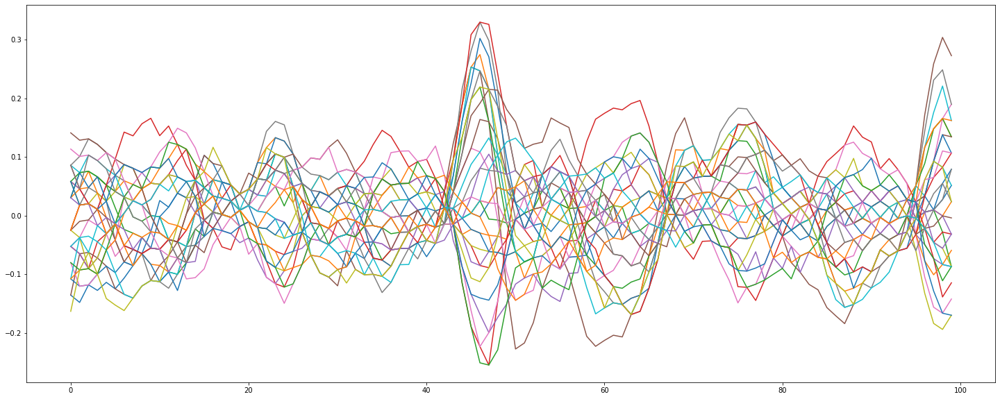

tensor([1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
        0, 1, 0, 1, 0, 1, 0, 0])
tensor([4, 6, 4, 5, 6, 4, 5, 5, 5, 5, 4, 1, 4, 3, 2, 4, 5, 4, 2, 6, 3, 1, 5, 7,
        2, 3, 3, 5, 4, 4, 3, 2])
tensor([  7, 159,  55, 179, 132, 184, 157,  63, 128, 175, 206, 124, 249, 243,
        123, 198, 143,  61, 108, 110, 255, 114,  89, 244, 144, 242,  72,  75,
         53, 251, 226, 134])


In [ ]:
PRINT = True
def print_one_batch(dataset, r=None):
    global PRINT
    train_loader = DataLoader(dataset, batch_size=32, shuffle=True)
    traces, labels_batch, pt, hw = train_loader.__iter__().next()
    if PRINT:
        print("Plot:")
        plt.figure(figsize=(25, 10))
        for tr in traces:
            if r is not None:
              plt.plot(tr[r[0]:r[1]])
            else:
              plt.plot(tr)
        plt.show()
    print(labels_batch[:, 0])
    print(hw[:, 0])
    print(pt)

print_one_batch(trainset, r=(100,200))

class_count: 2
traces shape: (1000, 1000)
pt shape: (1000, 16)
key shape: [152 169  10 198 162 188  38  73  60  59 224  75  17  53  85 212]
key: [152 169  10 198 162 188  38  73  60  59 224  75  17  53  85 212]


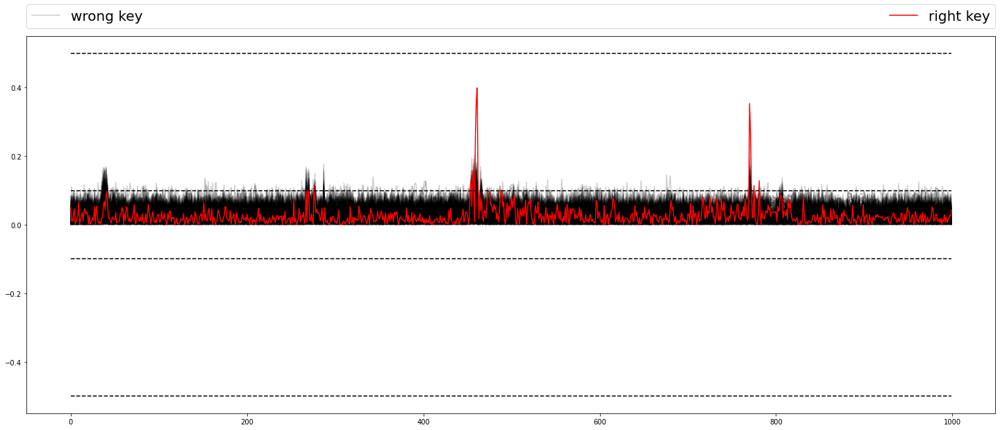

Plot:


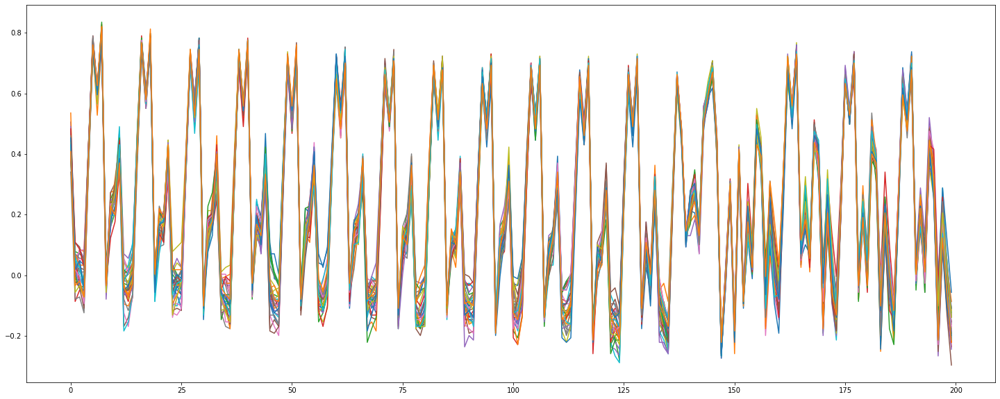

tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
        0, 0, 0, 0, 1, 1, 0, 0])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
tensor([ 97, 186, 107, 215,  77,  78,  13,  72, 132, 137, 243, 118, 175, 145,
         40,  20,  73, 241, 177, 209,  34, 120, 220, 246, 175, 189,  21,  47,
         96, 198, 141, 123])


In [ ]:
def align(traces, hi=100):
    shifts = np.random.randint(low=1, high=hi, size=traces.shape[0])
    for i,s in enumerate(shifts):
      traces[i,s:] = traces[i,0:-s]
    return traces[:,hi:]
    
def norm_2(traces):
  _min = np.min(traces)
  traces = traces - _min
  _max = np.max(traces)
  return 2*(traces / _max) - 1


class CHES_nonprofiled_dataset(Dataset):
    def __init__(self):

        lebeling_func = Bit_labeling(7)
        self.lebeling_func = lebeling_func
        print("class_count: {}".format(self.get_class_count()))

        path = CHES2016_PATH
        dir = 'traces_CPA' #'traces_desync' 
        self.traces = np.load(path + dir + '/traces.npy')
        self.key =    np.load(path + dir + '/knownkey.npy')
        self.pt =     np.load(path + dir + '/textin.npy')
        #self.traces = np.tile(self.traces, (3,1))
        #self.pt = np.tile(self.pt, (3,1))

        #self.traces = align(self.traces, hi=50)

        self.traces = self.traces[:,0:1000]
        #self.traces = mooving_average(self.traces, n=16)
        self.element_shape = self.traces.shape[1]
        print("traces shape:", self.traces.shape)
        print("pt shape:", self.pt.shape)
        print("key shape:", self.key)
        print("key:", self.key)
        GOODKEY = self.key[0]


        self.traces = norm_2(self.traces)
        self.labels = []
        self.plain = []
        self.labels_HW = []
        p = 0
        
        for p in self.pt:
          l_tmp = [AES_Sbox[ p[0] ^ k ]  for k in range(256)]

          l = lebeling_func(l_tmp)
          self.labels.append(l)
          
        self.labels = np.array(self.labels)
        names = 'r, AES_Sbox[pt ^ key ] ^ r, AES_Sbox[pt ^ key ] ^ r_out, r_in, r_out, pt ^ r, pt ^ r ^ key, r ^ key,pt ^ r_in, pt ^ r_out'.split(',')
        
        labels = self.labels
        kg_len = labels.shape[1]
        labels = np.array(labels)
        l_mean = np.mean(labels, axis=0)
        labels = labels - l_mean

        #print(f"Labels shape {labels.shape}")

        traces = self.traces
        trace_len = traces.shape[1]
        mean = np.mean(traces, axis=0)
        traces = (traces - mean)
        #print(f"Traces shape {traces.shape}")


        r_i_j = np.dot(labels.T, traces) # 256x700
        zn = np.sqrt(np.dot(np.sum(labels**2,axis=0).reshape(kg_len, 1), np.sum(traces**2, axis=0).reshape(1,trace_len)) )

        r_i_j = r_i_j / zn
        #print(r_i_j.shape)
        #print("Labling func:",labelings[a])
        plt.figure(figsize=(25, 10))
        if kg_len == 256:
          formats = ['k-'if i != GOODKEY else 'r-' for i in range(256)]
          alphas = [0.2 if i != GOODKEY else 1.0 for i in range(256)]
        good_param = []
        for i in range(kg_len):
          if  kg_len != 256:
            plt.plot(range(trace_len),r_i_j[i, :], label=names[i])
          else:
            if i != GOODKEY:
              if i == 0:
                plt.plot(range(trace_len),np.abs(r_i_j[i, :]),formats[i], alpha=alphas[i], label='wrong key')
              else:
                plt.plot(range(trace_len),np.abs(r_i_j[i, :]),formats[i], alpha=alphas[i])
            else:
              good_param = [range(trace_len), np.abs(r_i_j[i, :]),'r-']
        plt.plot(*good_param, label='right key')
        plt.plot(range(trace_len), [0.5] * trace_len, "k--")
        plt.plot(range(trace_len), [0.1] * trace_len, "k--")
        plt.plot(range(trace_len), [-0.1] * trace_len, "k--")
        plt.plot(range(trace_len), [-0.5] * trace_len, "k--")
        plt.legend(fontsize=20, bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left',
           ncol=2, mode="expand", borderaxespad=0.)
        plt.show()

    def get_class_count(self):
        return self.lebeling_func.get_class_count()

    def get_key(self):
        return self.key[0]
    
    def get_elenemt_shape(self):
        return self.element_shape

    def __len__(self):
        return len(self.traces)

    @staticmethod
    def has_validate_set(self):
        '''For CHES we have not date for validating'''
        return False

    def __getitem__(self, index):
        sample = self.traces[index]
        labels = self.labels[index]
        pt = self.pt[index,0]
        hw = np.zeros(256)
        #if self.transforms:
        sample = torch.from_numpy(sample).float()
        labels = torch.from_numpy(labels).long()
        pt = torch.tensor(pt).long()
        hw = torch.tensor(hw).long()
        #print(sample.min(), sample.max())
        return sample, labels, pt, hw

ches_dataset = CHES_nonprofiled_dataset()
trainset = ches_dataset
print_one_batch(ches_dataset, r=(300,500))

class_count: 2
traces shape: (1000, 1000)
pt shape: (1000, 16)
key shape: [152 169  10 198 162 188  38  73  60  59 224  75  17  53  85 212]
key: [152 169  10 198 162 188  38  73  60  59 224  75  17  53  85 212]


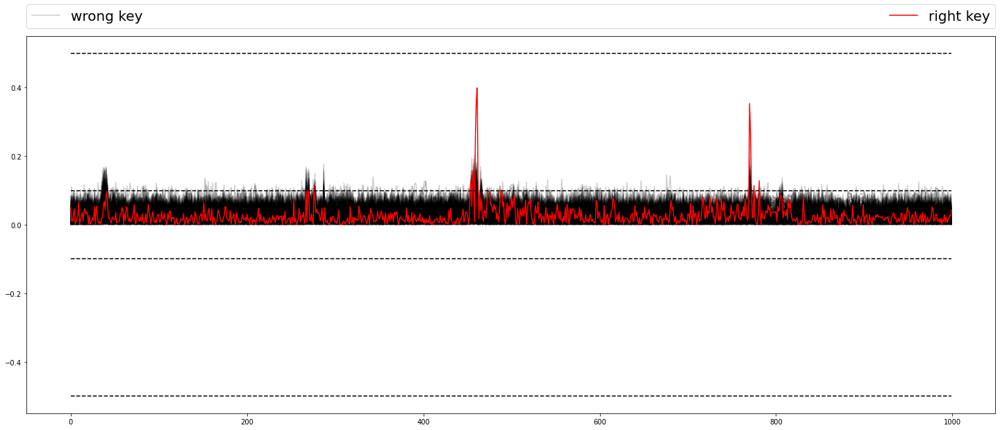

Plot:


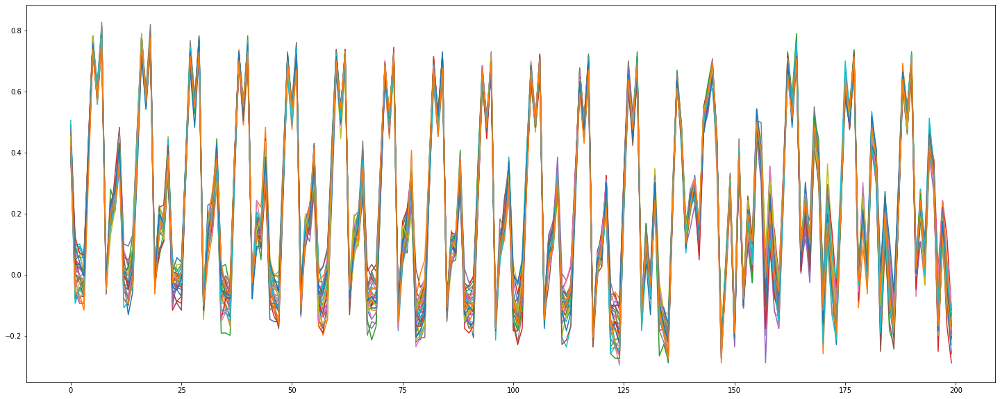

tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
        0, 1, 1, 1, 0, 0, 0, 1])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
tensor([245, 131,  79, 227,  63, 153,  33, 155, 247,  48,  12,   3, 207, 213,
        121,   8, 108, 125, 113,   0, 250, 179,  21, 120,  40, 239, 147, 214,
        188, 164, 218,  16])


<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(0)


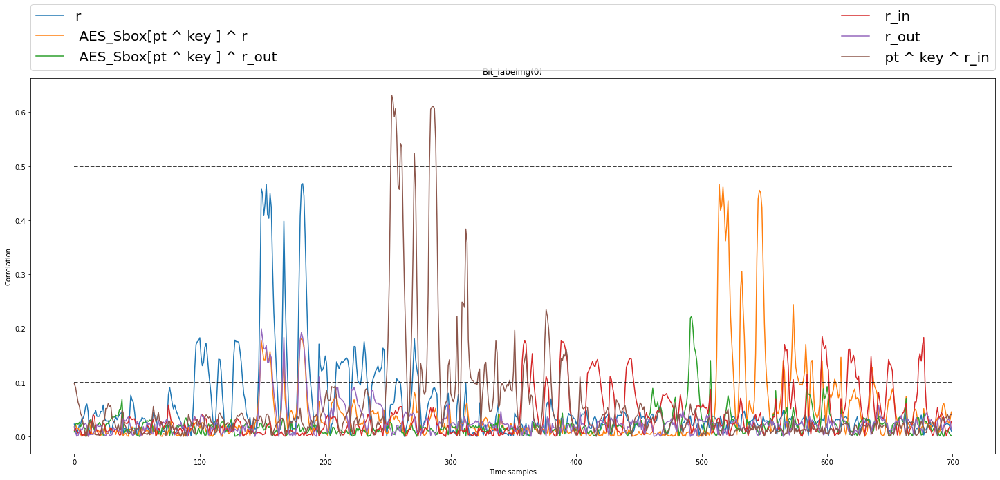

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(1)


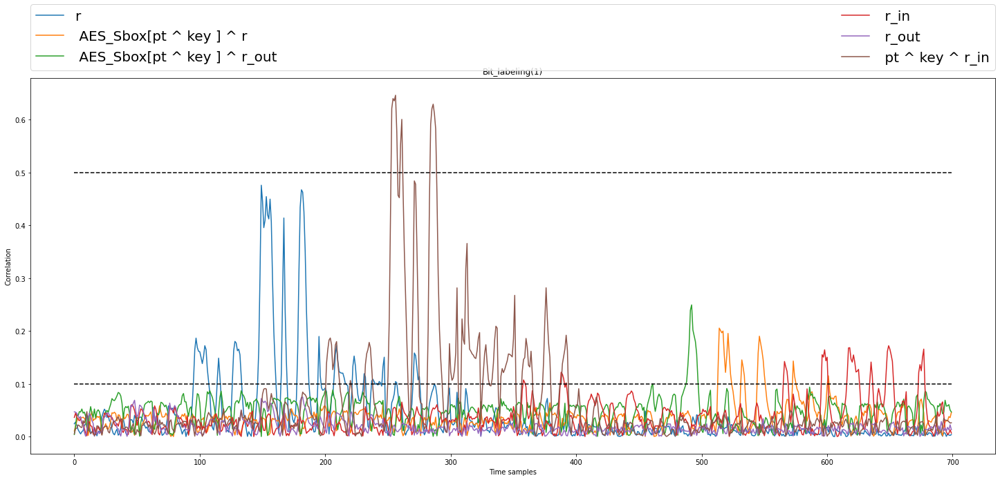

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(2)


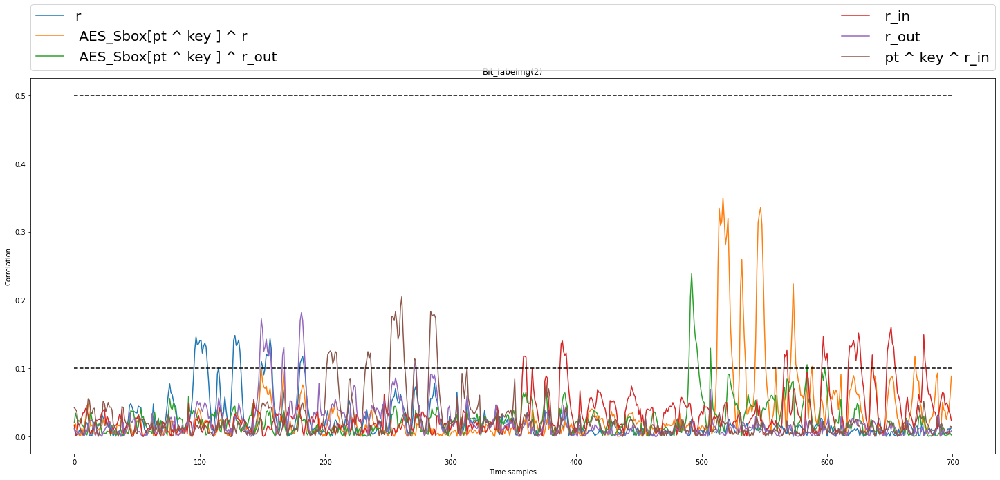

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(3)


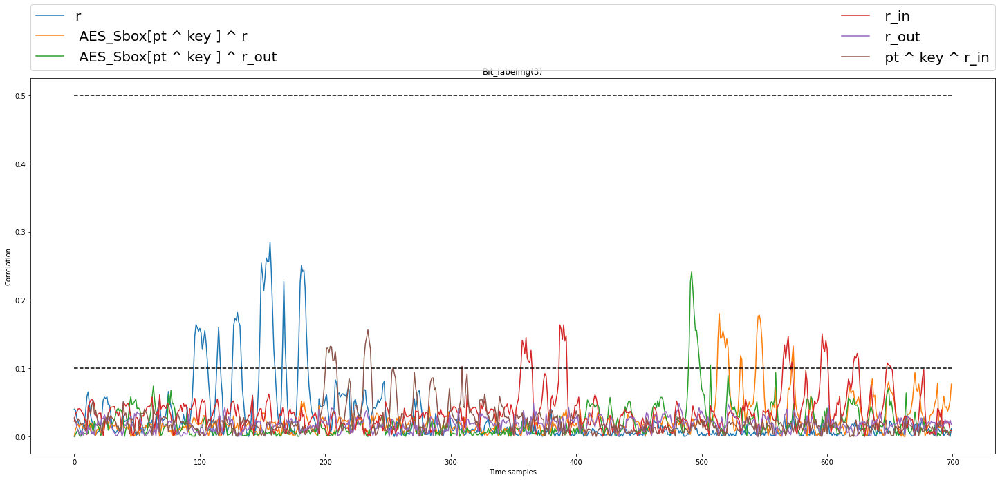

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(4)


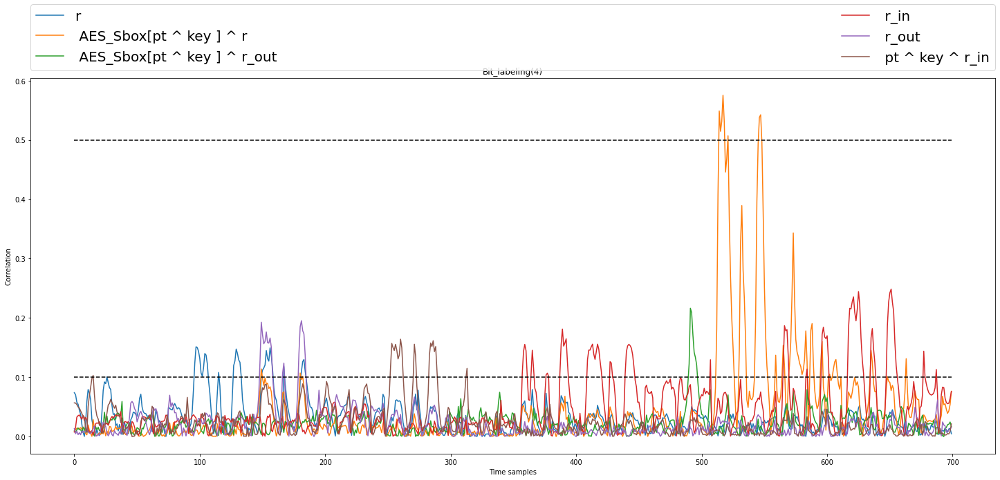

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(5)


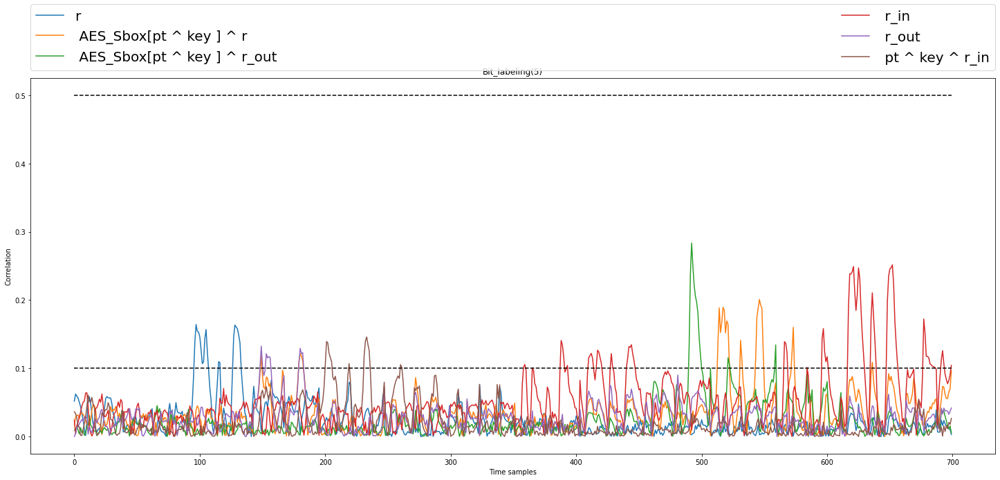

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(6)


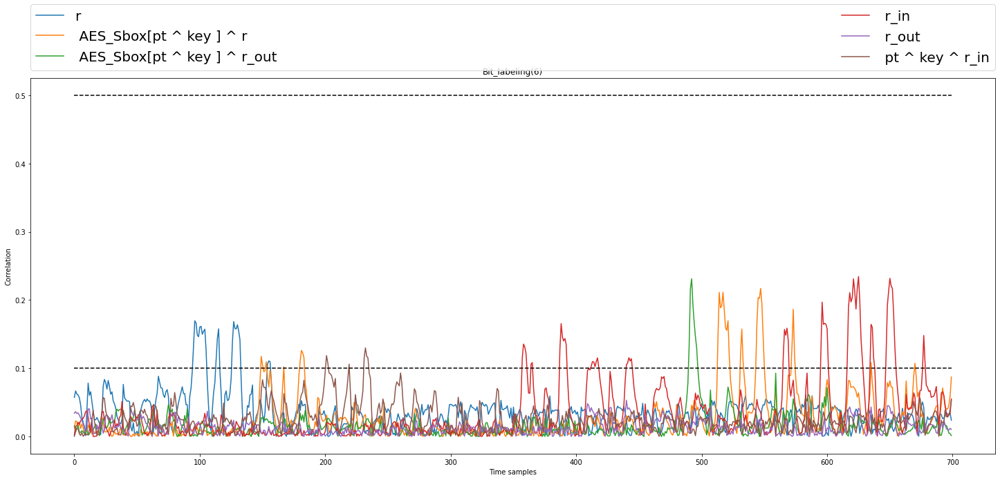

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Bit_labeling(7)


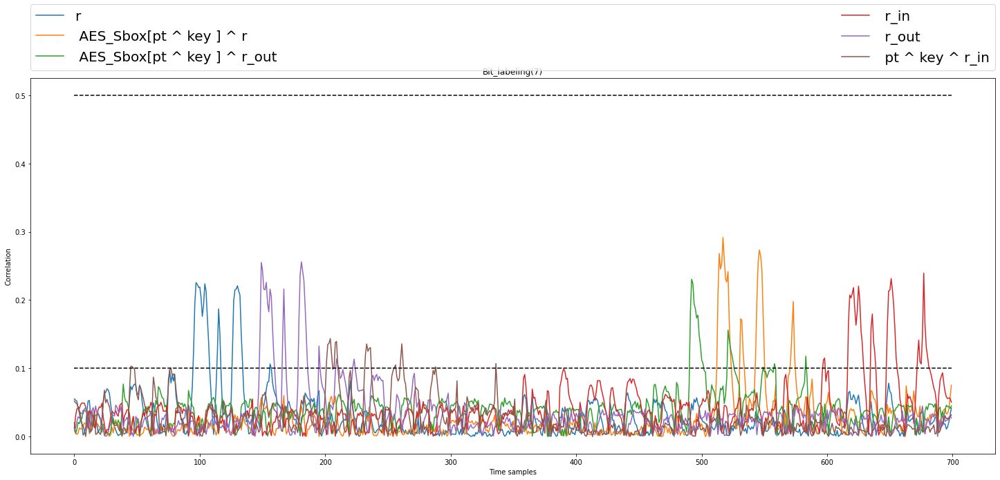

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: Binary_HW_labeling()


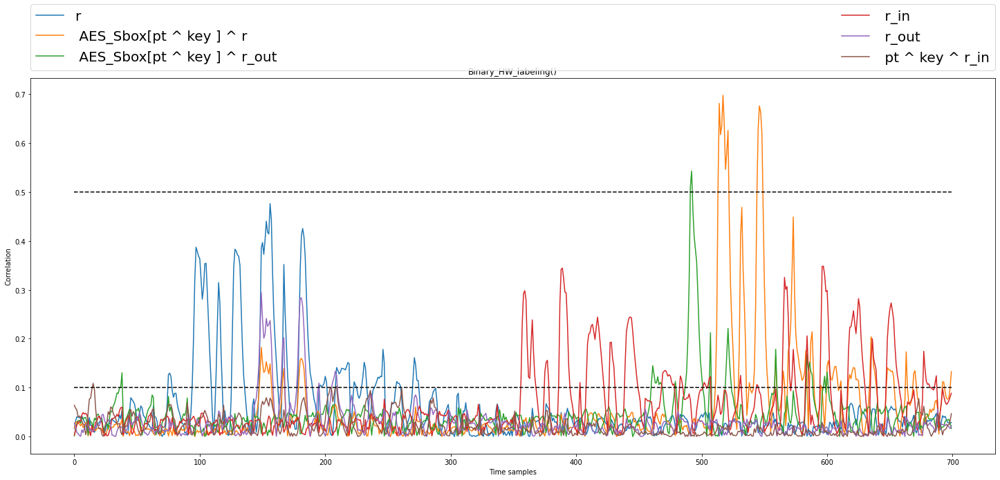

<KeysViewHDF5 ['Attack_traces', 'Profiling_traces']>
KEY: 224, GOODKEY:224 NofTraces: 2000
Labling func: HW_labeling()


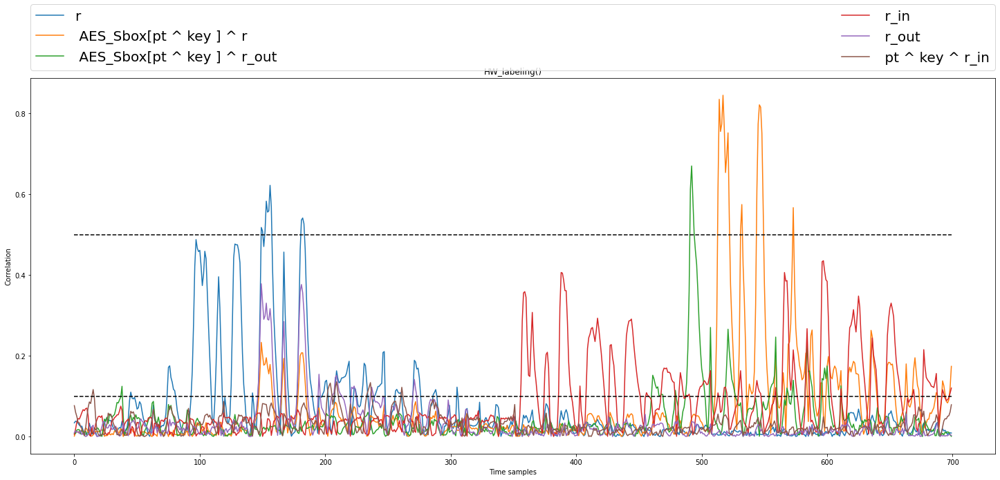

In [ ]:
AES_Sbox1 = np.zeros_like(AES_Sbox)
def mooving_average(arr, n=3, original_shape=False):
  r = np.cumsum(arr, axis=1,dtype=np.float64)
  r = r[:,n:] - r[:,:-n]
  r = r / n
  if original_shape:
    pad_size = arr.shape[1] - r.shape[1]
    pad2 = np.zeros((r.shape[0],pad_size//2))
    pad1 = np.zeros((r.shape[0],pad_size - pad_size//2))
    r = np.concatenate((pad1, r,pad2),axis=1)
  return r

def CPA(filename, byte_index, count=2000, a=0):
        
        assert byte_index < 16
        data, _, metadata = load_ascad(filename, load_metadata=True)
        metadata = metadata[0]
        key = metadata[0][2][byte_index] # (0 trace, 2 column)
        traces = data[0][:count] 
        #traces = mooving_average(traces, n=104)
        #traces = traces[:,1:] - traces[:,:-1]
        #traces = traces - np.min(traces)
        #traces = traces/ np.max(traces) - 0.5
        orig_labels = data[1][:count]
        #print(orig_labels.shape)
        trace_len = len(traces[0])
        
        GOODKEY=key
        print(f"KEY: {key}, GOODKEY:{GOODKEY} NofTraces: {len(traces)}")
        labels = []
        p = 0
        #labeling = HW_labeling()
        labelings = [Bit_labeling(i) for i in range(8)] + [Binary_HW_labeling(), HW_labeling()]
        key_guess = list(range(256))
        for i, meta in enumerate(metadata[:count]):
          pt = meta[0][byte_index]
          r_in = meta[3][14]
          r_out = meta[3][15]
          assert meta[2][byte_index] == key
          if byte_index >= 2:
            r = meta[3][byte_index - 2]
            r_next = meta[3][13]
          else:
            r = 0
          #l = [AES_Sbox[pt ^ k ]   for k in key_guess]
          #l = [r, AES_Sbox[pt ^ key ] ^ r, AES_Sbox[pt ^ key ] ^ r_out, r_in, r_out, pt ^ r, pt ^ r ^ key, r ^ key,pt ^ r_in, pt ^ r_out]
          l = [r, AES_Sbox[pt ^ key ] ^ r, AES_Sbox[pt ^ key ] ^ r_out, r_in, r_out, pt ^ key ^ r_in]
          #l = [key]
          l = [labelings[a].one(v) for v in l]

          #l = [ _l.one( pt ^ r_in ^ key) for _l in labelings ]
          
          #print(orig_labels[i], l[GOODKEY], l.index(orig_labels[i]))
          #assert orig_labels[i]==l[GOODKEY]
          #l = labeling(l)
          labels.append(l)


        names = [str(i) for i in labelings]
        names = 'r, AES_Sbox[pt ^ key ] ^ r, AES_Sbox[pt ^ key ] ^ r_out, r_in, r_out, pt ^ key ^ r_in'.split(',')
        
        kg_len = len(labels[0])
        labels = np.array(labels)
        l_mean = np.mean(labels, axis=0)
        labels = labels - l_mean

        #print(f"Labels shape {labels.shape}")

        mean = np.mean(traces, axis=0)
        traces = (traces - mean)
        #print(f"Traces shape {traces.shape}")


        r_i_j = np.dot(labels.T, traces) # 256x700
        zn = np.sqrt(np.dot(np.sum(labels**2,axis=0).reshape(kg_len, 1), np.sum(traces**2, axis=0).reshape(1,trace_len)) )

        r_i_j = r_i_j / zn
        #print(r_i_j.shape)
        print("Labling func:",labelings[a])
        plt.figure(figsize=(25, 10))
        plt.title(str(labelings[a]))
        plt.xlabel("Time samples")
        plt.ylabel("Correlation")
        if kg_len == 256:
          formats = ['k-'if i != GOODKEY else 'r-' for i in range(256)]
          alphas = [0.2 if i != GOODKEY else 1.0 for i in range(256)]
          names = ['good key' if i == GOODKEY else '' if i!=0 else 'bad key' for i in range(256)]
        for i in range(kg_len):
          if  kg_len != 256:
            plt.plot(range(trace_len),np.abs(r_i_j[i, :]), label=names[i])
          else:
            plt.plot(range(trace_len),r_i_j[i, :],formats[i], alpha=alphas[i], label=names[i])
        
        plt.plot(range(trace_len), [0.5] * trace_len, "k--")
        plt.plot(range(trace_len), [0.1] * trace_len, "k--")
        #plt.plot(range(trace_len), [-0.1] * trace_len, "k--")
        #plt.plot(range(trace_len), [-0.5] * trace_len, "k--")
        plt.legend(fontsize=20, bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left',
           ncol=2, mode="expand", borderaxespad=0.)
        plt.show()
        
        SAVE_DATA = False
        if SAVE_DATA:
          save_data = [str(labelings[a]), r_i_j, names]
          with open('/content/drive/My Drive/datasets/article_results/{}_{}_.pickle'.format("ASCAD_correlation",a), 'wb') as f:
            pickle.dump(save_data, f)

for i in range(10):
  CPA(ASCAD_DATASET_SYNC, 2, count=2000, a=i)
#CPA(ASCAD_DATASET, 2, count=2000, a=0)

#CPA(ASCAD_DATASET, 2, count=2000, a=1)
#CPA(ASCAD_DATASET, 2, count=2000, a=7)

In [ ]:
class MLP(nn.Module):
    def __init__(self, class_count, input_size):
        super(MLP, self).__init__()
        print("Trace input size: {}".format(input_size))

        if class_count==2:
          class_count=1

        self.trace_analyze = nn.Sequential(
            nn.Linear(input_size, 20, bias=True),
            nn.ReLU()
            )
        self.decoder = nn.Sequential(
            nn.Linear(20, 10, bias=True),
            nn.ReLU(),
            nn.Linear(10, class_count, bias=True),
            nn.Sigmoid()
        )
        self.weights = [self.trace_analyze[0],  self.decoder[0], self.decoder[2]]
        self.loss_fn = nn.BCELoss() #nn.CrossEntropyLoss()

    def forward(self, x, plain):
        x = x.view(x.size(0), -1)
        #plain = plain.view(plain.size(0), -1)
        x = self.trace_analyze(x)
        #x = torch.cat((x, plain), 1)
        return self.decoder(x).view(-1)
    
    def get_weights(self):
        return self.trace_analyze[0].weight.detach(), self.decoder[0].weight.detach(), self.decoder[2].weight.detach()

    def get_first_weight(self):
        return self.trace_analyze[0].weight

    def loss(self, outputs, labels):
        return self.loss_fn(outputs, labels)

    def reinit(self):
        for param in self.parameters():
          torch.nn.init.normal_(param)


CUDA = torch.cuda.device_count()
device = 'cuda'

print(CUDA)
x = torch.ones( [32] + [trainset.get_elenemt_shape()] )
x = x[:,None,:]
p = torch.ones((32,1))

net = MLP(2, trainset.get_elenemt_shape())
if False and CUDA:
  x.to(device)
  net.to(device)
  p = p.cuda()
  p = p.float()
#print(torch.ones((5,50))[:,5])
print(net)
net.reinit()
print(net(x,p).shape)
pytorch_total_params = sum(p.numel() for p in net.parameters())
print("Param_count: {}".format(pytorch_total_params))

a,b,c = net.get_weights()
print(a.mean(), b.mean(), c.mean())

1
Trace input size: 700
MLP(
  (trace_analyze): Sequential(
    (0): Linear(in_features=700, out_features=20, bias=True)
    (1): ReLU()
  )
  (decoder): Sequential(
    (0): Linear(in_features=20, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=1, bias=True)
    (3): Sigmoid()
  )
  (loss_fn): BCELoss()
)
torch.Size([32])
Param_count: 14241
tensor(-0.0039) tensor(-0.0523) tensor(0.3991)


In [ ]:

class CNN(nn.Module):
    def __init__(self, class_count, input_size):
        super(CNN, self).__init__()

        if class_count == 2:
          class_count = 1

        x = torch.ones((2,1,input_size))
        print("Input size: {} class_count: {}".format(x.size(), class_count))

        self.sync =  nn.Sequential(*[      
                nn.Conv1d(1, 4, kernel_size=4, stride=1, dilation=1, padding=0, bias=False),

                nn.MaxPool1d(50, stride=25, padding=(0)),
                #nn.Dropout(p=0.2),

                nn.BatchNorm1d(4, affine=True, track_running_stats=True),
                nn.ReLU(),
                
           
        ])
        x = self.sync(x)
        print(f"sync out: {x.size()}")
        #print(self.layers[0].weight.size())
        #nn.init.constant_(self.sync[0].weight[0], 1/4)
        #nn.init.constant_(self.sync[0].weight[1], -1/4)

        self.internal =  nn.Sequential(*[
                nn.Conv1d(x.size(1), 4, kernel_size=x.size(2), stride=1, dilation=1, padding=0, bias=False),
                nn.BatchNorm1d(4, affine=True, track_running_stats=True),
                nn.ReLU(),
                #nn.Sigmoid()

        ])
        #x = self.internal(x)
        print(f"internal out: {x.size()}")


        mlp_size = x.view(x.size(0), -1).size(1)
        #print(f"3 size out: {mlp_size}")
        self.last = nn.Sequential(
            #nn.Linear(mlp_size, 20, bias=True),
            #nn.Linear(mlp_size, class_count, bias=True)
            nn.Conv1d(x.size(1), 1, kernel_size=x.size(2), stride=1, dilation=1, padding=0, bias=False),
            #nn.BatchNorm1d(1, affine=True, track_running_stats=True),
            nn.Sigmoid()
        )
        if class_count == 1:
          self.loss_fn = nn.BCELoss()#nn.CrossEntropyLoss() #nn.MSELoss()
        else:
          self.loss_fn = nn.CrossEntropyLoss()

        self.w = []
        self.bn = []

    def forward(self, x, plain):
        #x = torch.nn.functional.conv1d(x, self.fconv)
        x = self.sync(x)
        #x = self.internal(x)
        x = self.last(x) 
        #plain = plain.view(plain.size(0), -1)
        #x = torch.cat((x, plain), 1)
        return x.view(-1)

    def reinit(self):
        for w in self.w:
          torch.nn.init.xavier_uniform_(w)
        for w in self.bn:
          torch.nn.init.zeros_(w)

    def get_weights(self):
        return [self.sync[0].weight[0,0,:].cpu().detach().numpy(),
               self.internal[0].weight.cpu().detach().numpy(),
               self.last[0].weight.cpu().detach().numpy(),
               ]
    
    def loss(self, outputs, labels):
        return self.loss_fn(outputs, labels) #+ (self.layers[0].weight.sum() - 1) * 1e-8

    def get_first_weight(self):
        return self.sync[0].weight

    def get_weight(self):
        return self.sync[0].weight

CUDA = torch.cuda.device_count()
device = 'cuda'

print("CUDA =",CUDA)
x = torch.ones( [32] + [trainset.get_elenemt_shape()] )
x = x[:,None,:]

p = torch.ones((32,8))

net = CNN(2, trainset.get_elenemt_shape())
if CUDA:
  x = x.to(device)
  net = net.to(device)
  p = p.to(device)
#print(torch.ones((5,50))[:,5])
print(net)
print("test input size: ", x.size())
net.reinit()
print(net(x,p).shape)
pytorch_total_params = sum(p.numel() for p in net.parameters())
print("Param_count: {}".format(pytorch_total_params))

CUDA = 1
Input size: torch.Size([2, 1, 700]) class_count: 1
sync out: torch.Size([2, 4, 26])
internal out: torch.Size([2, 4, 26])
CNN(
  (sync): Sequential(
    (0): Conv1d(1, 4, kernel_size=(4,), stride=(1,), bias=False)
    (1): MaxPool1d(kernel_size=50, stride=25, padding=0, dilation=1, ceil_mode=False)
    (2): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
  )
  (internal): Sequential(
    (0): Conv1d(4, 4, kernel_size=(26,), stride=(1,), bias=False)
    (1): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (last): Sequential(
    (0): Conv1d(4, 1, kernel_size=(26,), stride=(1,), bias=False)
    (1): Sigmoid()
  )
  (loss_fn): BCELoss()
)
test input size:  torch.Size([32, 1, 700])
torch.Size([32])
Param_count: 552


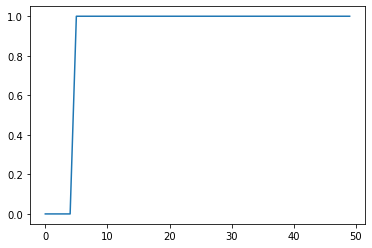

In [ ]:


epochs = 30
def grad_mul_coefs(epoch_count):
  return [0 if i < 5  else 1 for i in range(epoch_count)]

plt.figure()
plt.plot(grad_mul_coefs(50))
plt.show()




Tesla T4
[224, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 

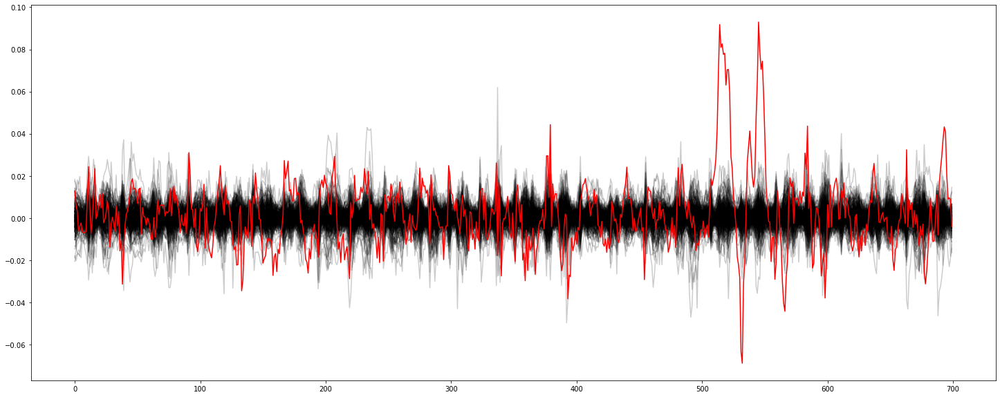

	acc:


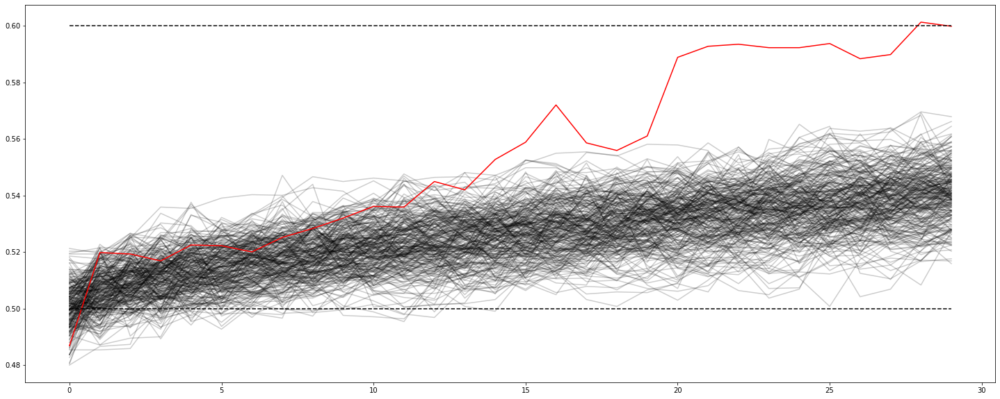

	loss:


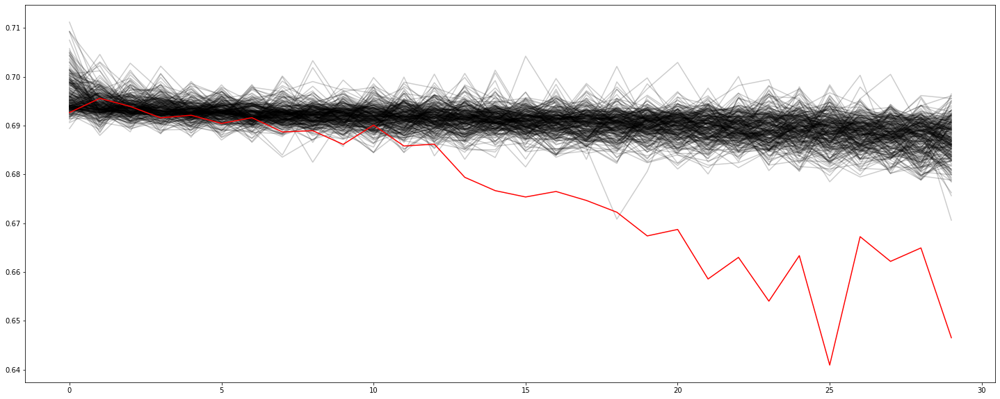

VALID
	sensetive


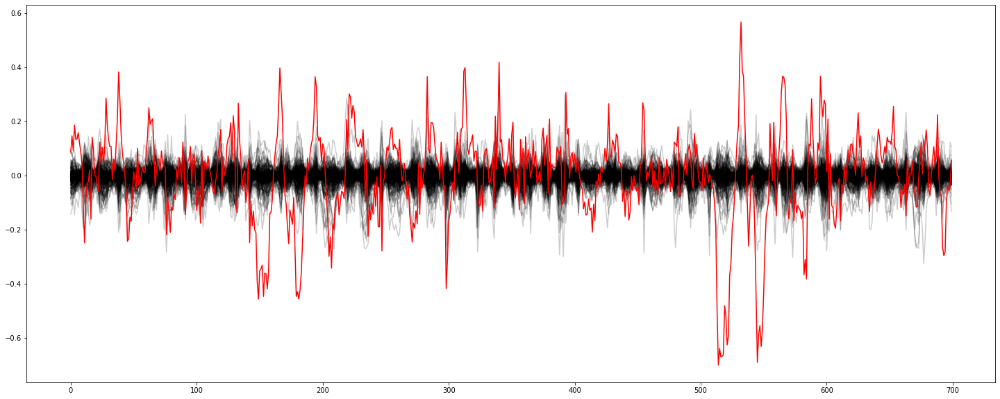

	valid acc:


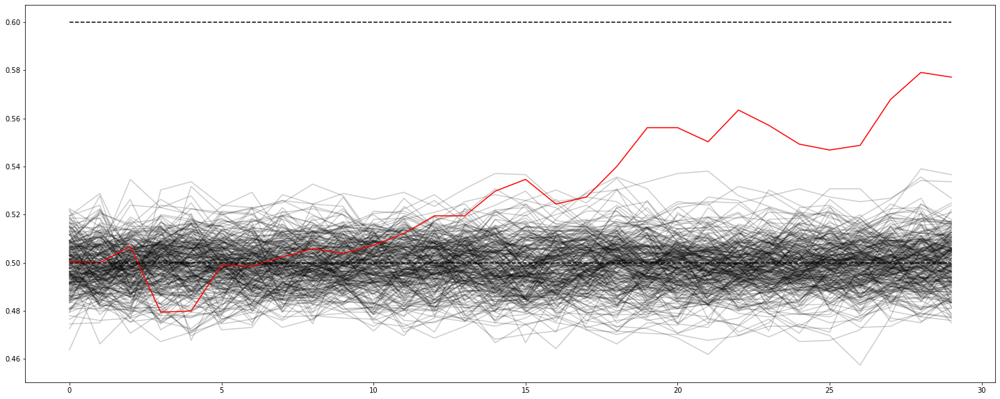

	valid loss:


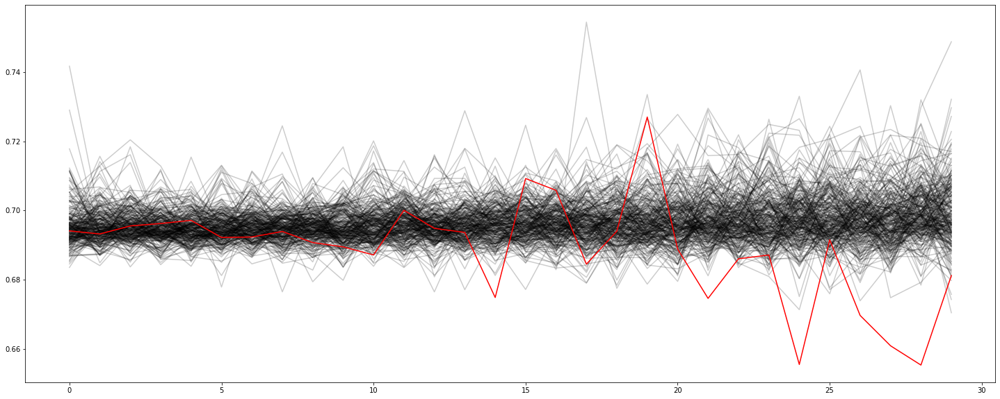

In [ ]:
import gc
gc.collect()
print(torch.cuda.get_device_name())
torch.cuda.init()
#torch.cuda.empty_cache()
torch.cuda.synchronize()

#key_guess = [trainset.get_key()] + [143] + [156] #+ [177, 223, 225]#[ 77, 251, 224, 242, 114,  33, 254,  16, 167, 141,  74, 220, 142,  73,   4, 105] #list(range(256))#[1,2,242,224,251]
key_guess =  [trainset.get_key()] + list(range(trainset.get_key())) + list(range(trainset.get_key()+1,256))
print(key_guess)
BS = 2000

GOODKEY = key_guess.index(trainset.get_key())

VALIDATE = trainset.has_validate_set()
SAVE_DATA = False
print(f"GOOD_KEY_INDEX={GOODKEY}")

grads_by_model = [[] for _ in range(len(key_guess))]
acum_grads_by_model = [[] for _ in range(len(key_guess))]
acc_by_model = [[] for _ in range(len(key_guess))]
losses_by_model = [[] for _ in range(len(key_guess))]
weihts_grad_by_model = [[] for _ in range(len(key_guess))]


vgrads_by_model = [[] for _ in range(len(key_guess))]
acum_vgrads_by_model = [[] for _ in range(len(key_guess))]
valid_acc_by_model = [[] for _ in range(len(key_guess))]
valid_losses_by_model = [[] for _ in range(len(key_guess))]
weihts_vgrad_by_model = [[] for _ in range(len(key_guess))]

mean_train_losses = []
mean_test_losses = []
mean_triplet_count = []
test_acc_list = []
train_acc_list = []
balanced_test_acc = []
models_opt = []

weights_mean = []
weights_std = []
weights = []

hw_correct_train = []
hw_correct_valid = []


def train():
    start_time = datetime.datetime.now()
    print(f"Start trainitg at {start_time.strftime('%m.%d_%H:%M:%S')}")

    train_loader = DataLoader(trainset, batch_size=BS, shuffle=True)
    if VALIDATE:
      valid_loader = DataLoader(validset, batch_size=BS, shuffle=True)
    
    for j, kg in enumerate(key_guess):

      print(f"\n\tStart trainitg {j} at {datetime.datetime.now().strftime('%m.%d_%H:%M:%S')}")
      #model.reinit()
      MODEL = MLP #CNN #
      model = MODEL(trainset.get_class_count(), trainset.get_elenemt_shape())
      if CUDA:
          model = model.to(device)
      #optimizer = Optimizer(model.parameters())
      optimizer = torch.optim.Adam(model.parameters(), lr=0.01,  amsgrad=False)
      #optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9, nesterov=True)
      

      grad_coefs = grad_mul_coefs(epochs)
      
      w_mean = []

      w_std = []
      
      for epoch in range(epochs):
          epoch_start_time = time.time()
          model.train()

          train_losses = []
          grads = None
          w_grads = None

          correct = 0
          total = 0

          hw_correct = torch.zeros(9)
          
          iter_count = len(train_loader)
          model.train()
          for i, data in enumerate(train_loader):
              traces, labels, pt, hw = data
              traces = traces[:,None,:]
              labels = labels[:,key_guess[j]].float()#.view(traces.size(0), -1)
              if CUDA:
                  traces = traces.to(device)
                  labels = labels.to(device)
                  pt = pt.to(device)
                  #hw = hw.to(device)
                
              optimizer.zero_grad()
              traces.requires_grad = True

              outputs = model(traces, pt)

              if 0:
                _, predicted = torch.max(outputs.data, 1)
                correct += (predicted == labels).sum().item()
              else:
                predicted = (outputs.data > 0.5).type(torch.float16) 
                correct += (predicted == labels).sum(0).cpu().detach().numpy()
              total += labels.size(0)

              #print(hw[:, j])
              #print(predicted == labels)
              #for idx in (predicted == labels).nonzero().cpu().numpy():
              #  hw_el = hw[:, j][idx]
              #  hw_correct[hw_el] += 1
              #print(hw_correct)

              loss = model.loss(outputs, labels)
                
              loss.backward()

              if grads is None:
                  grads = traces.grad.sum(dim=0) * grad_coefs[epoch]
              else:
                  grads += traces.grad.sum(dim=0) * grad_coefs[epoch]

              if 0:
                if w_grads is None:
                  w_grads = model.get_first_weight().grad.abs().sum()
                else:
                  w_grads += model.get_first_weight().grad.abs().sum()
                weights.append(model.get_weights())
              

              optimizer.step()
              train_losses.append(loss.item())

          #hw_correct_train.append(hw_correct.numpy())
          g = grads.cpu().numpy()
          grads_by_model[j].append(g)
                
          acc_by_model[j].append(correct/total)
          losses_by_model[j].append( sum(train_losses)/len(train_losses))


          if VALIDATE:
            vcorrect = 0
            vtotal = 0
            valid_losses = []
            vgrads = None
            
            w_vgrads = None
            iter_count = len(valid_loader)

            model.eval()
            for i, data in enumerate(valid_loader):
                traces, labels, pt, hw = data
                traces = traces[:,None,:]
                labels = labels[:,key_guess[j]].float()#.view(traces.size(0), -1)

                #print(model.bn_list[3].bias)
                if CUDA:
                    traces = traces.to(device)
                    labels = labels.to(device)
                    pt = pt.to(device)
                    #hw = hw.to(device)

                  
                optimizer.zero_grad()
                traces.requires_grad = True

                outputs = model(traces, pt)

                if 0:
                  _, predicted = torch.max(outputs.data, 1)
                  vcorrect += (predicted == labels).sum().item()
                else:
                  predicted = (outputs.data > 0.5).type(torch.float16) 
                  vcorrect += (predicted == labels).sum(0).cpu().detach().numpy()
                
                vtotal += labels.size(0)

                loss = model.loss(outputs, labels)
                loss.backward()

                
                if vgrads is None:
                    vgrads = traces.grad.sum(dim=0) * grad_coefs[epoch]
                else:
                    vgrads += traces.grad.sum(dim=0) * grad_coefs[epoch]

                if 0:
                  if w_vgrads is None:
                    w_vgrads = model.get_first_weight().grad.abs().sum()
                  else:
                    w_vgrads += model.get_first_weight().grad.abs().sum()

                valid_losses.append(loss.item())

            
            #acum_vgrads_by_model[j].append(g.sum())
            #weihts_grad_by_model[j].append(w_grads.item())

            #acum_grads_by_model[j].append(g.sum())
            #weihts_vgrad_by_model[j].append(w_vgrads.item())
            
            g = vgrads.cpu().numpy()
            vgrads_by_model[j].append(g)
            valid_losses_by_model[j].append( sum(valid_losses)/len(valid_losses))
            valid_acc_by_model[j].append(vcorrect/vtotal)
            
            

            
            

            #a,b,c = model.get_weights()
            #w_mean.append([a.mean(), b.mean(), c.mean()])
            #w_std.append([a.std(), b.std(), c.std()])

            print(f"\rModel {j+1}/{len(key_guess)} epoch:{epoch} _ loss={losses_by_model[j][-1]}, vloss={valid_losses_by_model[j][-1]} train_acc={acc_by_model[j][-1]} valid_acc={valid_acc_by_model[j][-1]}", end="")
          else:
            print(f"\rModel {j+1}/{len(key_guess)} epoch:{epoch} _ loss={losses_by_model[j][-1]} train_acc={acc_by_model[j][-1]}", end="")

    end_time = datetime.datetime.now()
    print(f"\nEnd trainitg at {end_time.strftime('%m.%d_%H:%M:%S')}")
    print(f"Training tim#e: {(end_time-start_time).total_seconds()}s")
    
    print("\nTRAIN\n\tsensetive:")
    plt.figure(figsize=(25, 10))
    good_key_plot_param = None
    for i,model in enumerate(grads_by_model):
      s = 0
      for ep in model:
        s+=ep
      s = s.reshape(-1)
      if i!=GOODKEY:
        plt.plot(range(len(s)),s,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(s)), s, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.show()

    print("\tacc:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(acc_by_model):
      if i!= GOODKEY:
        plt.plot(range(epochs),model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(epochs), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.plot(range(epochs), [0.5]* epochs, 'k--')
    plt.plot(range(epochs), [0.6]* epochs, 'k--')
    plt.show()

    print("\tloss:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(losses_by_model):
      if i!= GOODKEY:
        plt.plot(range(epochs), model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(epochs), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.show()

    if 0:
      print("\taccum_grad:")
      plt.figure(figsize=(25, 10))
      for i,model in enumerate(acum_grads_by_model):
        al = 0.2 if i!= GOODKEY else 1.0
        plt.plot(range(epochs),model,'b-' if i != GOODKEY else 'r-', alpha=al)
      plt.show()

      print("\tw_grad:")
      plt.figure(figsize=(25, 10))
      for i,model in enumerate(weihts_grad_by_model):
        al = 0.2 if i!= GOODKEY else 1.0
        plt.plot(range(epochs),model,'b-' if i != GOODKEY else 'r-', alpha=al)
      plt.show()

    if VALIDATE:
      print("VALID\n\tsensetive")
      plt.figure(figsize=(25, 10))
      for i,model in enumerate(vgrads_by_model):
        s = 0
        for ep in model:
          s+=ep
        s = s.reshape(-1)
        if i!= GOODKEY:
          plt.plot(range(700),s,'k-', alpha=0.2)
        else:
          good_key_plot_param = [range(700),s, 'r-']
      plt.plot(*good_key_plot_param, alpha=1.0)
      plt.show()

      print("\tvalid acc:")
      plt.figure(figsize=(25, 10))
      for i,model in enumerate(valid_acc_by_model):
        if i!= GOODKEY:
          plt.plot(range(epochs),model,'k-', alpha=0.2)
        else:
          good_key_plot_param = [range(epochs), model, 'r-']
      plt.plot(*good_key_plot_param, alpha=1.0)
      plt.plot(range(epochs), [0.5]* epochs, 'k--')
      plt.plot(range(epochs), [0.6]* epochs, 'k--')
      plt.show()

      print("\tvalid loss:")
      plt.figure(figsize=(25, 10))
      for i,model in enumerate(valid_losses_by_model):
        if i!= GOODKEY:
          plt.plot(range(epochs),model,'k-', alpha=0.2)
        else:
          good_key_plot_param = [range(epochs), model, 'r-']
      plt.plot(*good_key_plot_param, alpha=1.0)
      plt.show()


      if 0 :
        print("\taccum_grad:")
        plt.figure(figsize=(25, 10))
        for i,model in enumerate(acum_vgrads_by_model):
          al = 0.2 if i!= GOODKEY else 1.0
          plt.plot(range(epochs),model,'b-' if i != GOODKEY else 'r-', alpha=al)
        plt.show()

        print("\tw_grad:")
        plt.figure(figsize=(25, 10))
        for i,model in enumerate(weihts_vgrad_by_model):
          al = 0.2 if i!= GOODKEY else 1.0
          plt.plot(range(epochs),model,'b-' if i != GOODKEY else 'r-', alpha=al)
        plt.show()

    #print(model.sync[0].weight)

    if SAVE_DATA:
      with open('/content/drive/My Drive/datasets/data_{}_.pickle'.format(datetime.datetime.now().strftime("%m.%d_%H:%M:%S")), 'wb') as f:
        pickle.dump([grads_by_model, acc_by_model, losses_by_model,acum_grads_by_model, weihts_grad_by_model,
                    vgrads_by_model, valid_acc_by_model, valid_losses_by_model, acum_vgrads_by_model, weihts_vgrad_by_model], f)

train()


TRAIN
	sensetive:


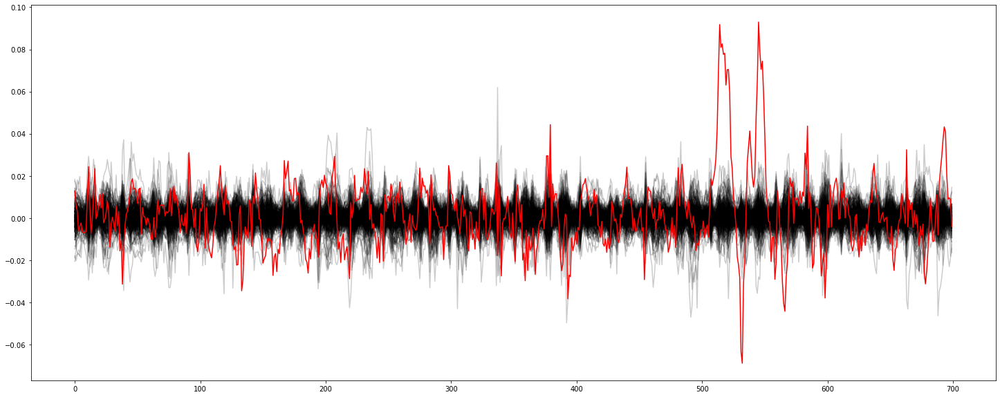

	acc:


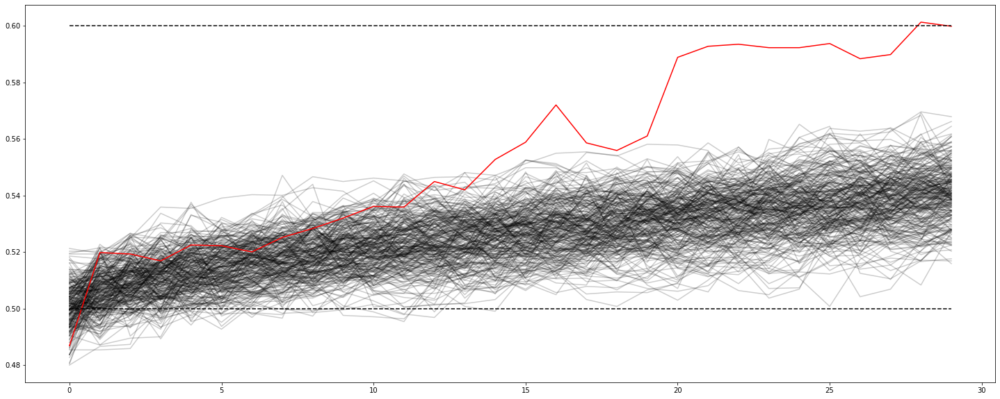

	loss:


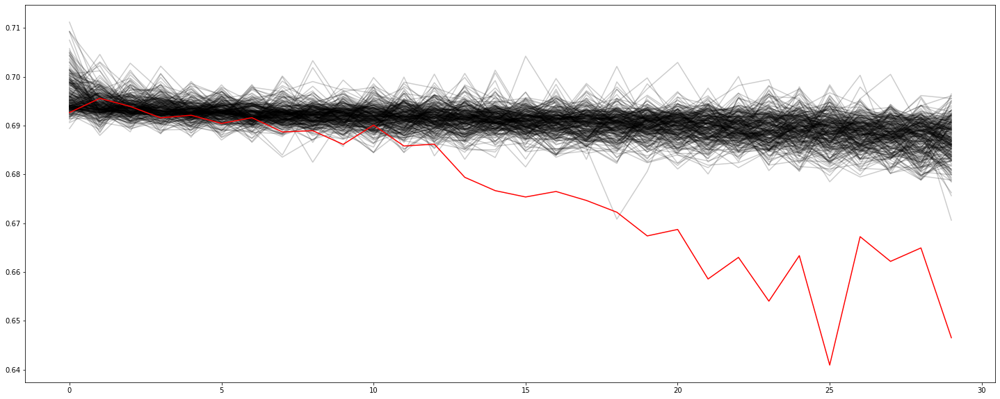

VALID
	sensetive


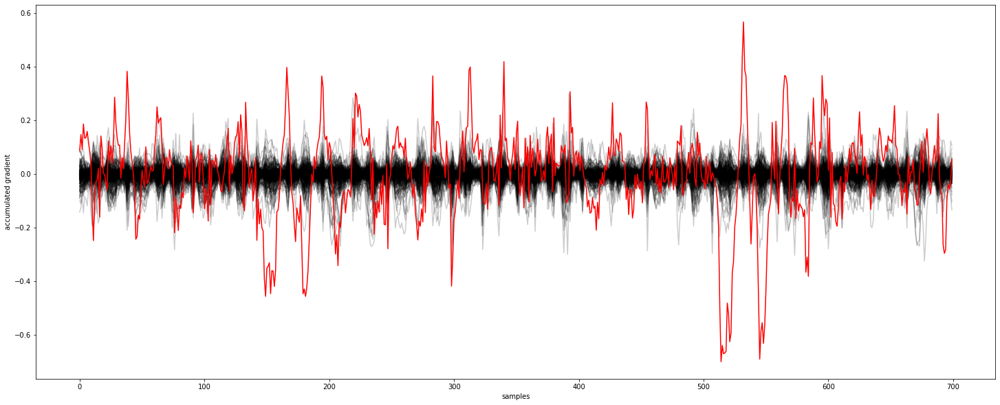

	valid acc:


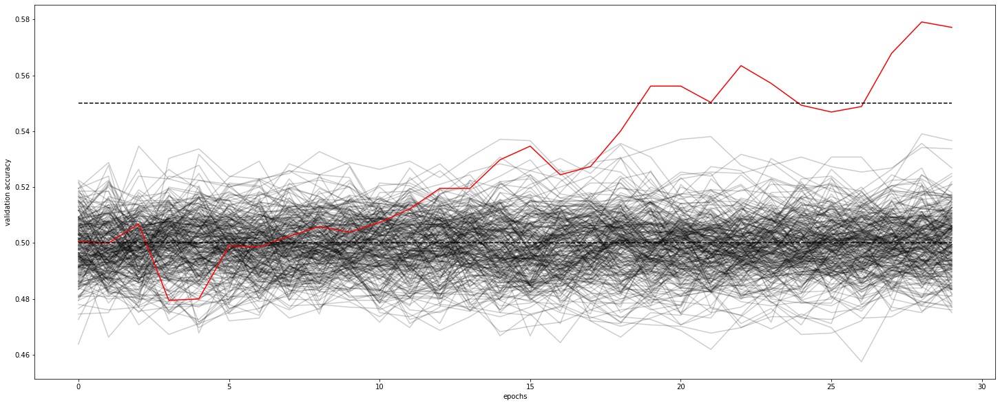

	valid loss:


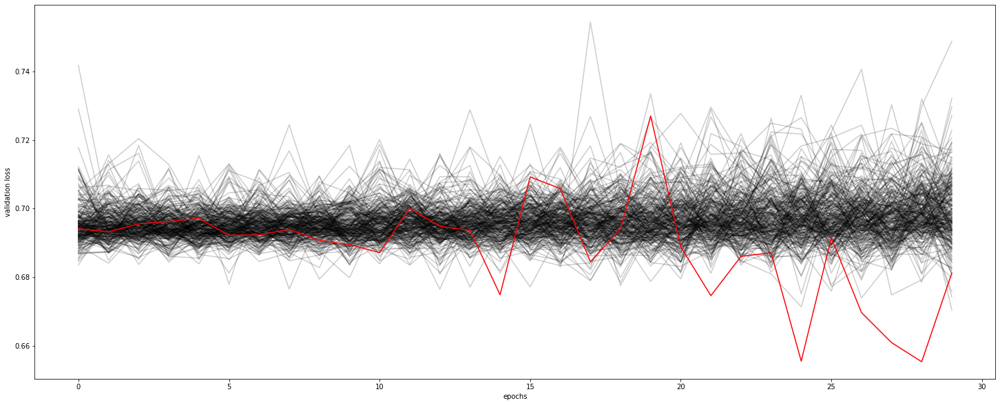

In [36]:
if 1:
    print("\nTRAIN\n\tsensetive:")
    plt.figure(figsize=(25, 10))
    good_key_plot_param = None
    for i,model in enumerate(grads_by_model):
      s = 0
      for ep in model:
        s+=ep
      s = s.reshape(-1)
      if i!=GOODKEY:
        plt.plot(range(len(s)),s,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(s)), s, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.show()

    print("\tacc:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(acc_by_model):
      if i!= GOODKEY:
        plt.plot(range(len(model)),model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(model)), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.plot(range(epochs), [0.5]* epochs, 'k--')
    plt.plot(range(epochs), [0.6]* epochs, 'k--')
    plt.show()

    print("\tloss:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(losses_by_model):
      if i!= GOODKEY:
        plt.plot(range(len(model)), model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(model)), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.show()

    print("VALID\n\tsensetive")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(vgrads_by_model):
      s = 0
      for ep in model:
        s+=ep
      s = s.reshape(-1)
      if i!= GOODKEY:
        plt.plot(range(len(s)),s,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(s)),s, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.ylabel("accumulated gradient")
    plt.xlabel("samples")
    plt.show()

    print("\tvalid acc:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(valid_acc_by_model):
      if i!= GOODKEY:
        plt.plot(range(len(model)),model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(model)), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.plot(range(epochs), [0.5]* epochs, 'k--')
    plt.plot(range(epochs), [0.55]* epochs, 'k--')
    plt.ylabel("validation accuracy")
    plt.xlabel("epochs")
    plt.show()

    print("\tvalid loss:")
    plt.figure(figsize=(25, 10))
    for i,model in enumerate(valid_losses_by_model):
      if i!= GOODKEY:
        plt.plot(range(len(model)),model,'k-', alpha=0.2)
      else:
        good_key_plot_param = [range(len(model)), model, 'r-']
    plt.plot(*good_key_plot_param, alpha=1.0)
    plt.ylabel("validation loss")
    plt.xlabel("epochs")
    plt.show()


In [ ]:

print("len:", len(weights))
print("\weights:")
plt.figure(figsize=(25, 10))
beg = 0
size = 10

p1 = []
for i,w in enumerate(weights[0:epochs*BATCH_COUNT]): #w[0] (300), 
  p1.append(w[0]) 

for i,p in enumerate(p1[0:epochs*BATCH_COUNT:10]):
  plt.plot(p, label='{}'.format(i))
plt.plot(list(range(len(p1[0]))), [0]*len(p1[0]), 'k--')
plt.legend()
plt.draw()

In [ ]:

print("len:", len(weights))
print("\weights:")
plt.figure(figsize=(25, 10))
p1 = []
p2 = [[] for i in range(16)]
p2[0].append(1)
print(p2)
print((weights[0][1][1]).sum())
for i,w in enumerate(weights[0:epochs*10]): 
  for j in range(4):
    p2[j].append((w[1][j]).sum())  
#print(p2)
#plt.plot(p1)
print(len(p2[1]))
for i, p in enumerate(p2):
  plt.plot(p, label='{}'.format(i))
plt.legend()
plt.draw()


plt.figure(figsize=(25, 10))
for i,w in enumerate(weights[0:epochs*10]): #w[0] (300), 
  p1.append(w[0].sum()) 
plt.plot(p1, label='{}'.format(i))
plt.draw()

In [ ]:

plt.figure(figsize=(25, 25))
filter_count = 4
p2 = [[] for i in range(filter_count)]
p2[0].append(1)
print(p2)
print((weights[0][1][1]).sum())
for i,w in enumerate(weights[0:epochs*10]): 
  for j in range(filter_count):
    p2[j].append(w[1][j][0])  

for i, p in enumerate(p2):
  for j,s in enumerate(p[::100]):
    plt.plot(s - 1*i, label='{}:{}'.format(i,j))

plt.legend()
plt.draw()

In [ ]:
print(len(hw_correct_train))
one = np.array(hw_correct_train[0:epochs])
print(one.shape, trainset.hw_statistic[224].shape)
print(trainset.hw_statistic[224])
hw_indices = np.array([0,1,2,3,4,5,6,7,8])
plt.figure(figsize=(25, 10))
for idx in hw_indices:
  plt.plot(range(epochs),(one[:,idx] / trainset.hw_statistic[224][idx]), label='hw{}'.format(idx))
plt.plot(range(epochs),[0.5]*epochs, "k--")
plt.plot(range(epochs),[0.6]*epochs, "k--")
plt.legend()
plt.draw()

In [ ]:
print("len:", len(weights))
print("\weights:")
plt.figure(figsize=(25, 10))
beg = 0
size = 10

p1 = []
p2 = []
p3 = []
for i,w in enumerate(weights[0:epochs*10]): #w[0] (300), 
  p1.append(w[0].sum()) 
  p2.append(w[1].sum()) 
  p3.append(w[2].sum()) 

plt.plot(p1, label='{}'.format(0))
plt.plot(p2, label='{}'.format(1))
plt.plot(p3, label='{}'.format(2))
plt.legend()
plt.draw()